In [1]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset, random_split
import torch.optim as optim
from torchvision import datasets, transforms
from torchvision.models import resnet18
import random
import itertools
import numpy as np

In [2]:
for i in range(torch.cuda.device_count()):
   print(torch.cuda.get_device_properties(i).name)

Quadro RTX 6000
Quadro RTX 6000


In [3]:
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(42)

In [4]:
# Define the Shared Encoder (ResNet-18 Backbone)
class SharedEncoder(nn.Module):
    def __init__(self, rotation_model_weights=None):
        super(SharedEncoder, self).__init__()
        self.backbone = resnet18(weights=None)
        self.backbone = nn.Sequential(*list(self.backbone.children())[:-2])  # Remove the final classification layer

        # Load rotation weights if provided
        if rotation_model_weights:
            state_dict = torch.load(rotation_model_weights)
            self.backbone.load_state_dict(state_dict, strict=False)
            print("Loaded rotation model weights into the shared encoder.")

    def forward(self, x):
        return self.backbone(x)

In [5]:
# Define the Jigsaw Head
class JigsawHead(nn.Module):
    def __init__(self, num_patches, num_permutations):
        super(JigsawHead, self).__init__()
        self.fc = nn.Sequential(
            nn.Linear(512 * num_patches, 1024),  # Feature size * number of patches
            nn.ReLU(),
            nn.Linear(1024, num_permutations)
        )
    
    def forward(self, x):
        return self.fc(x)

In [6]:
# Combined Model with Shared Encoder and Jigsaw Head
class RotationJigsawModel(nn.Module):
    def __init__(self, num_patches, num_permutations, rotation_model_weights=None):
        super(RotationJigsawModel, self).__init__()
        
        # Shared Encoder with pre-trained rotation weights
        self.backbone = SharedEncoder(rotation_model_weights)
        
        # Jigsaw Task-Specific Head
        self.jigsaw_head = JigsawHead(num_patches=num_patches, num_permutations=num_permutations)

    def forward(self, x):
        batch_size, num_patches, channels, height, width = x.shape
        patches = []
        
        # Process each patch independently through the shared encoder
        for i in range(num_patches):
            patch_features = self.backbone(x[:, i])  # Extract features for each patch
            patch_features = torch.flatten(patch_features, start_dim=1)  # Flatten each patch's features
            patches.append(patch_features)
        
        # Concatenate features from all patches
        concatenated_features = torch.cat(patches, dim=1)  # Shape: [batch_size, 512 * num_patches]
        
        # Forward pass through the jigsaw head
        output = self.jigsaw_head(concatenated_features)
        return output

# Dataset Setup for STL-10 and Jigsaw Task Data Augmentation
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),  
    transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4), 
    transforms.RandomGrayscale(p=0.1), 
    transforms.ToTensor(),  
])

In [7]:
# # Load STL-10 dataset
# train_dataset_full = datasets.STL10(root='./data', split='train+unlabeled', download=True, transform=transform)

# # Split into train and validation sets (80% train, 20% validation)
# train_size = int(0.8 * len(train_dataset_full))
# val_size = len(train_dataset_full) - train_size
# train_dataset, val_dataset = random_split(train_dataset_full, [train_size, val_size])

import torch
from torchvision import datasets, transforms
from torch.utils.data import random_split

# Define transforms for the Caltech101 dataset
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to a fixed size
    transforms.ToTensor(),          # Convert images to PyTorch tensors
    transforms.Normalize((0.5,), (0.5,))  # Normalize images (adjust mean and std as needed)
])

# Load Caltech101 dataset
train_dataset_full = datasets.Caltech101(root='./data', download=True, transform=transform)

# Split into train and validation sets (80% train, 20% validation)
train_size = int(0.8 * len(train_dataset_full))
val_size = len(train_dataset_full) - train_size
train_dataset, val_dataset = random_split(train_dataset_full, [train_size, val_size])

# Example: Print the sizes of train and validation datasets
print(f"Train size: {len(train_dataset)}, Validation size: {len(val_dataset)}")


Files already downloaded and verified
Train size: 6245, Validation size: 1562


In [ ]:
# # Custom Dataset for Jigsaw Task
# class JigsawSTL10Dataset(Dataset):
#     def __init__(self, dataset, grid_size=3, permutations=None):
#         self.dataset = dataset
#         self.grid_size = grid_size
#         self.permutations = permutations or self.create_permutations()

#     def create_permutations(self, num_patches=9, num_permutations=1000):
#         import itertools
#         import random
#         all_permutations = list(itertools.permutations(range(num_patches)))
#         random.seed(42)  # For reproducibility
#         selected_permutations = random.sample(all_permutations, num_permutations)
#         return selected_permutations

#     def create_jigsaw_puzzle(self, image):
#         _, height, width = image.shape
#         patch_h, patch_w = height // self.grid_size, width // self.grid_size
#         patches = []

#         # Extract patches
#         for i in range(self.grid_size):
#             for j in range(self.grid_size):
#                 patch = image[:, i * patch_h: (i + 1) * patch_h, j * patch_w: (j + 1) * patch_w]
#                 patches.append(patch)

#         # Select random permutation
#         perm_class = random.choice(range(len(self.permutations)))
#         perm = self.permutations[perm_class]

#         # Shuffle patches based on permutation
#         shuffled_patches = [patches[i] for i in perm]
#         return torch.stack(shuffled_patches), torch.tensor(perm_class, dtype=torch.long)

#     def __getitem__(self, index):
#         img, _ = self.dataset[index]
#         shuffled_patches, perm_class = self.create_jigsaw_puzzle(img)
#         return shuffled_patches, perm_class

#     def __len__(self):
#         return len(self.dataset)

# # Initialize datasets for the Jigsaw Task
# jigsaw_train_dataset = JigsawSTL10Dataset(train_dataset)
# jigsaw_val_dataset = JigsawSTL10Dataset(val_dataset)

# # DataLoaders
# jigsaw_train_loader = DataLoader(jigsaw_train_dataset, batch_size=64, shuffle=True, num_workers=8)
# jigsaw_val_loader = DataLoader(jigsaw_val_dataset, batch_size=64, shuffle=False, num_workers=8)

# # Hyperparameters and Setup
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# num_patches = 9  # 3x3 grid
# num_permutations = 1000  # Number of jigsaw permutations
# rotation_weights_path = 'model_weights/rotation_pretext_cross_entropy_model.pth'  # Update with actual path

/tmp/ipykernel_891521/510699227.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(rotation_model_weights)


Loaded rotation model weights into the shared encoder.
Epoch [1/100], Training Loss: 6.9140
Epoch [1/100], Validation Loss: 6.9076
Model saved at Epoch 1
Epoch [2/100], Training Loss: 6.3134
Epoch [2/100], Validation Loss: 4.9843
Model saved at Epoch 2
Epoch [3/100], Training Loss: 4.4838
Epoch [3/100], Validation Loss: 4.0297
Model saved at Epoch 3
Epoch [4/100], Training Loss: 3.8839
Epoch [4/100], Validation Loss: 3.7030
Model saved at Epoch 4
Epoch [5/100], Training Loss: 3.6275
Epoch [5/100], Validation Loss: 3.5266
Model saved at Epoch 5
Epoch [6/100], Training Loss: 3.4703
Epoch [6/100], Validation Loss: 3.4163
Model saved at Epoch 6
Epoch [7/100], Training Loss: 3.3568
Epoch [7/100], Validation Loss: 3.2779
Model saved at Epoch 7
Epoch [8/100], Training Loss: 3.2408
Epoch [8/100], Validation Loss: 3.1697
Model saved at Epoch 8
Epoch [9/100], Training Loss: 3.0745
Epoch [9/100], Validation Loss: 2.9954
Model saved at Epoch 9
Epoch [10/100], Training Loss: 2.8123
Epoch [10/100], 

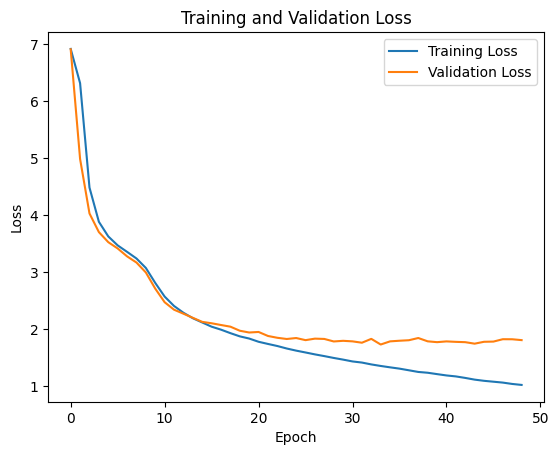

In [9]:
import os
import matplotlib.pyplot as plt

# Initialize the model with rotation weights
model = RotationJigsawModel(num_patches=num_patches, num_permutations=num_permutations, rotation_model_weights=rotation_weights_path).to(device)

if torch.cuda.device_count() > 1:
    model = nn.DataParallel(model)

# Directory to save the best model
checkpoint_dir = './model_weights'
os.makedirs(checkpoint_dir, exist_ok=True)

# Early stopping parameters
early_stopping_patience = 15
best_val_loss = float('inf')
no_improve_epochs = 0

# Lists to store training and validation losses for plotting
train_losses = []
val_losses = []

# Define Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

# Training Loop for Jigsaw Task
epochs = 100  # Adjust based on your requirements
for epoch in range(epochs):
    model.train()
    running_loss = 0.0

    # Training phase
    for batch_idx, (shuffled_patches, perm_class) in enumerate(jigsaw_train_loader):
        shuffled_patches, perm_class = shuffled_patches.to(device), perm_class.to(device)

        optimizer.zero_grad()
        outputs = model(shuffled_patches)
        loss = criterion(outputs, perm_class)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    # Calculate average training loss for the epoch
    avg_train_loss = running_loss / len(jigsaw_train_loader)
    train_losses.append(avg_train_loss)
    print(f"Epoch [{epoch+1}/{epochs}], Training Loss: {avg_train_loss:.4f}")

    # Validation phase
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for val_patches, val_perm_class in jigsaw_val_loader:
            val_patches, val_perm_class = val_patches.to(device), val_perm_class.to(device)
            val_outputs = model(val_patches)
            val_loss += criterion(val_outputs, val_perm_class).item()

    avg_val_loss = val_loss / len(jigsaw_val_loader)
    val_losses.append(avg_val_loss)
    print(f"Epoch [{epoch+1}/{epochs}], Validation Loss: {avg_val_loss:.4f}")

    # Model checkpointing based on validation loss
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        model_path = os.path.join(checkpoint_dir, 'rotation_jigsaw_trained_model.pth')
        torch.save({
            'epoch': epoch + 1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'best_val_loss': best_val_loss,
            'train_losses': train_losses,
            'val_losses': val_losses
        }, model_path)
        print(f"Model saved at Epoch {epoch+1}")
        no_improve_epochs = 0
    else:
        no_improve_epochs += 1

    # Early stopping based on validation loss
    if no_improve_epochs >= early_stopping_patience:
        print("Early stopping due to no improvement in validation loss.")
        break

# Plot training and validation losses
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [11]:
# ResNet Classifier for STL-10 (Downstream Task)
class ResNetClassifier(nn.Module):
    def __init__(self, pretrained_model, num_classes=10):
        super(ResNetClassifier, self).__init__()
        self.backbone = pretrained_model.module.backbone if isinstance(pretrained_model, nn.DataParallel) else pretrained_model.backbone # Use the backbone from the pre-trained jigsaw model
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Sequential(
            nn.Linear(512, 512),
            nn.ReLU(),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        x = self.backbone(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)  # Flatten feature map
        x = self.fc(x)
        return x

# Load the pre-trained jigsaw model
classification_model = ResNetClassifier(model, num_classes=10).to(device)

if torch.cuda.device_count() > 1:
    classification_model = nn.DataParallel(classification_model)

backbone = classification_model.module.backbone if isinstance(classification_model, nn.DataParallel) else classification_model.backbone
    
# Freeze the backbone for fine-tuning
for param in backbone.parameters():
    param.requires_grad = False

In [12]:
# CIFAR-10 DataLoader for classification task
train_dataset = datasets.STL10(root='./data', split='train', download=True, transform=transform)
classification_train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=4)
test_dataset = datasets.STL10(root='./data', split='test', download=True, transform=transform)
classification_test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=4)

Files already downloaded and verified
Files already downloaded and verified


In [14]:
# Fine-tuning loop
classification_criterion = nn.CrossEntropyLoss()
classification_optimizer = optim.Adam(classification_model.parameters(), lr=0.001)

classification_epochs = 150
best_val_loss = float('inf')
early_stopping_patience = 10
no_improve_epochs = 0

for epoch in range(classification_epochs):
    classification_model.train()
    running_loss = 0.0
    for batch_idx, (inputs, targets) in enumerate(classification_train_loader):
        inputs, targets = inputs.to(device), targets.to(device)

        classification_optimizer.zero_grad()
        outputs = classification_model(inputs)
        loss = classification_criterion(outputs, targets)
        loss.backward()
        classification_optimizer.step()

        running_loss += loss.item()

    avg_loss = running_loss / len(classification_train_loader)
    print(f"Epoch [{epoch+1}/{classification_epochs}], Loss: {avg_loss:.4f}")

    # Model checkpointing based on validation loss (use validation loader if needed)
    if avg_loss < best_val_loss:
        best_val_loss = avg_loss
        torch.save(classification_model.state_dict(), 'stl_rotation_jigsaw_model.pth')
        print(f"Classification model saved at Epoch {epoch+1}")
        no_improve_epochs = 0
    else:
        no_improve_epochs += 1

    # Early stopping
    if no_improve_epochs >= early_stopping_patience:
        print("Early stopping")
        break

# Evaluation with Top-1 and Top-5 Accuracy
classification_model.eval()
correct = 0
top_5_correct = 0
top_3_correct = 0
total = 0

with torch.no_grad():
    for images, labels in classification_test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = classification_model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        # Top-5 accuracy
        _, predicted_5 = torch.topk(outputs.data, k=5, dim=1)
        top_5_correct += (predicted_5 == labels.view(-1, 1)).sum().item()

        # Top-3 accuracy
        _, predicted_3 = torch.topk(outputs.data, k=3, dim=1)
        correct_3 = predicted_3.eq(labels.unsqueeze(1).expand_as(predicted_3))
        top_3_correct += correct_3.any(dim=1).sum().item()
       

accuracy = 100 * correct / total
top_5_accuracy = 100 * top_5_correct / total
top_3 = 100 * top_3_correct / total

print(f'Top-1 Accuracy: {accuracy:.2f}%')
print(f'Top-3 Accuracy: {top_3:.2f}%')
print(f'Top-5 Accuracy: {top_5_accuracy:.2f}%')

Epoch [1/150], Loss: 1.0165
Classification model saved at Epoch 1
Epoch [2/150], Loss: 0.9935
Classification model saved at Epoch 2
Epoch [3/150], Loss: 0.9694
Classification model saved at Epoch 3
Epoch [4/150], Loss: 0.9893
Epoch [5/150], Loss: 0.9944
Epoch [6/150], Loss: 1.0197
Epoch [7/150], Loss: 0.9668
Classification model saved at Epoch 7
Epoch [8/150], Loss: 0.9890
Epoch [9/150], Loss: 1.0016
Epoch [10/150], Loss: 0.9870
Epoch [11/150], Loss: 0.9542
Classification model saved at Epoch 11
Epoch [12/150], Loss: 0.9587
Epoch [13/150], Loss: 0.9787
Epoch [14/150], Loss: 0.9452
Classification model saved at Epoch 14
Epoch [15/150], Loss: 0.9588
Epoch [16/150], Loss: 0.9428
Classification model saved at Epoch 16
Epoch [17/150], Loss: 0.9827
Epoch [18/150], Loss: 0.9731
Epoch [19/150], Loss: 0.9948
Epoch [20/150], Loss: 0.9799
Epoch [21/150], Loss: 0.9681
Epoch [22/150], Loss: 0.9696
Epoch [23/150], Loss: 0.9402
Classification model saved at Epoch 23
Epoch [24/150], Loss: 0.9549
Epoch

# CALTECH101 Downstream Task

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision import datasets, transforms
from torchvision.models import resnet18
import random
import numpy as np
import os
import matplotlib.pyplot as plt
from IPython.display import clear_output
from sklearn.metrics import confusion_matrix
import seaborn as sns



In [2]:
# Set device and random seeds
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('Using device:', device)

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(42)

Using device: cuda


In [3]:
# Define the Shared Encoder (ResNet-18 Backbone)
class SharedEncoder(nn.Module):
    def __init__(self, rotation_model_weights=None):
        super(SharedEncoder, self).__init__()
        self.backbone = resnet18(weights=None)
        self.backbone = nn.Sequential(*list(self.backbone.children())[:-2])  # Remove the final classification layer

        # Load rotation weights if provided
        if rotation_model_weights:
            state_dict = torch.load(rotation_model_weights)
            self.backbone.load_state_dict(state_dict, strict=False)
            print("Loaded rotation model weights into the shared encoder.")

    def forward(self, x):
        return self.backbone(x)


# Classification Model for downstream task
class ClassificationModel(nn.Module):
    def __init__(self, encoder, num_classes=101):  # CALTECH101 has 101 classes
        super(ClassificationModel, self).__init__()
        self.encoder = encoder
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Sequential(
            nn.Linear(512, 512),
            nn.ReLU(),
            nn.Linear(512, num_classes)
        )
        
    def forward(self, x):
        x = self.encoder(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.fc(x)
        return x

In [4]:
# Data transformations with additional resize step
transform = transforms.Compose([
    transforms.Lambda(lambda x: x.convert('RGB')),  # Ensure all images are in RGB format
    transforms.Resize((224, 224)),  # Resize all images to same dimensions
    transforms.ToTensor(),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4),
    transforms.RandomGrayscale(p=0.1),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # ImageNet normalization
])

# Load CALTECH101 dataset with specific path
def load_caltech101():
    data_path = '/users/soh62/SSL-Project-seq/rotation_jigsaw/data/caltech101'
    
    # Create dataset with transforms
    full_dataset = datasets.Caltech101(root=data_path, download=True, transform=transform)
    
    # Create generator for reproducibility
    generator = torch.Generator().manual_seed(42)
    
    # Split into train and test sets (80% train, 20% test)
    train_size = int(0.8 * len(full_dataset))
    test_size = len(full_dataset) - train_size
    train_dataset, test_dataset = random_split(full_dataset, 
                                             [train_size, test_size],
                                             generator=generator)
    
    # Split train into train and validation (80% train, 20% validation)
    train_size = int(0.8 * len(train_dataset))
    val_size = len(train_dataset) - train_size
    train_dataset, val_dataset = random_split(train_dataset, 
                                            [train_size, val_size],
                                            generator=generator)
    
    print(f"Train size: {len(train_dataset)}, Val size: {len(val_dataset)}, Test size: {len(test_dataset)}")
    return train_dataset, val_dataset, test_dataset

# Load datasets
train_dataset, val_dataset, test_dataset = load_caltech101()

# Create data loaders with num_workers=4 and pin_memory=True for faster data loading
train_loader = DataLoader(train_dataset, 
                         batch_size=32, 
                         shuffle=True, 
                         num_workers=4,
                         pin_memory=True,
                         drop_last=True)  # Drop the last incomplete batch

val_loader = DataLoader(val_dataset, 
                       batch_size=32, 
                       shuffle=False, 
                       num_workers=4,
                       pin_memory=True,
                       drop_last=True)

test_loader = DataLoader(test_dataset, 
                        batch_size=32, 
                        shuffle=False, 
                        num_workers=4,
                        pin_memory=True,
                        drop_last=True)

Files already downloaded and verified
Train size: 5552, Val size: 1389, Test size: 1736


In [5]:
# Initialize model with pretrained backbone
rotation_weights_path = '/users/soh62/SSL-Project-seq/rotation_jigsaw/rotation_jigsaw_trained_model.pth'  # Update with your path
backbone = SharedEncoder(rotation_model_weights=rotation_weights_path)
classification_model = ClassificationModel(encoder=backbone.backbone).to(device)

if torch.cuda.device_count() > 1:
    classification_model = nn.DataParallel(classification_model)

# Training parameters
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(classification_model.parameters(), lr=0.001)

/tmp/ipykernel_2206606/4170231963.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(rotation_model_weights)


Loaded rotation model weights into the shared encoder.


In [6]:
# Initialize lists to store metrics for plotting
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
epochs_list = []

def plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies, epochs_list):
    clear_output(wait=True)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # Plot losses
    ax1.plot(epochs_list, train_losses, label='Training Loss', marker='o')
    ax1.plot(epochs_list, val_losses, label='Validation Loss', marker='o')
    ax1.set_title('Training and Validation Losses')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend()
    ax1.grid(True)
    
    # Plot accuracies
    ax2.plot(epochs_list, train_accuracies, label='Training Accuracy', marker='o')
    ax2.plot(epochs_list, val_accuracies, label='Validation Accuracy', marker='o')
    ax2.set_title('Training and Validation Accuracies')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy (%)')
    ax2.legend()
    ax2.grid(True)
    
    plt.tight_layout()
    plt.show()

# Training loop with visualization
# Initialize lists to store metrics for plotting
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
epochs_list = []

# Training loop with only printing (no live plotting)
epochs = 150
early_stopping_patience = 
best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(epochs):
    classification_model.train()
    running_loss = 0.0
    train_correct = 0
    train_total = 0

    for inputs, targets in train_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        
        optimizer.zero_grad()
        outputs = classification_model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Calculate training accuracy
        _, predicted = torch.max(outputs.data, 1)
        train_total += targets.size(0)
        train_correct += (predicted == targets).sum().item()

    avg_train_loss = running_loss / len(train_loader)
    train_accuracy = 100 * train_correct / train_total

    # Validation
    classification_model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    
    with torch.no_grad():
        for val_inputs, val_targets in val_loader:
            val_inputs, val_targets = val_inputs.to(device), val_targets.to(device)
            val_outputs = classification_model(val_inputs)
            val_loss += criterion(val_outputs, val_targets).item()
            
            # Calculate validation accuracy
            _, predicted = torch.max(val_outputs.data, 1)
            val_total += val_targets.size(0)
            val_correct += (predicted == val_targets).sum().item()

    avg_val_loss = val_loss / len(val_loader)
    val_accuracy = 100 * val_correct / val_total

    # Store metrics for later plotting
    train_losses.append(avg_train_loss)
    val_losses.append(avg_val_loss)
    train_accuracies.append(train_accuracy)
    val_accuracies.append(val_accuracy)
    epochs_list.append(epoch + 1)

    # Print metrics
    print(f"Epoch [{epoch+1}/{epochs}]")
    print(f"Train Loss: {avg_train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%")
    print(f"Val Loss: {avg_val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%")

    # Model checkpointing
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save(classification_model.state_dict(), 'caltech101_classification_model.pth')
        print(f"Model saved at Epoch {epoch+1}")
        no_improve_epochs = 0
    else:
        no_improve_epochs += 1

    # Early stopping
    if no_improve_epochs >= early_stopping_patience:
        print("Early stopping triggered")
        break

print("\nTraining completed!")

Epoch [1/150]
Train Loss: 3.9201, Train Accuracy: 18.80%
Val Loss: 3.7131, Val Accuracy: 22.46%
Model saved at Epoch 1
Epoch [2/150]
Train Loss: 3.3569, Train Accuracy: 27.19%
Val Loss: 3.2052, Val Accuracy: 30.52%
Model saved at Epoch 2
Epoch [3/150]
Train Loss: 2.9839, Train Accuracy: 34.27%
Val Loss: 2.8009, Val Accuracy: 37.43%
Model saved at Epoch 3
Epoch [4/150]
Train Loss: 2.7261, Train Accuracy: 37.77%
Val Loss: 2.6169, Val Accuracy: 40.19%
Model saved at Epoch 4
Epoch [5/150]
Train Loss: 2.4680, Train Accuracy: 42.77%
Val Loss: 2.3976, Val Accuracy: 43.53%
Model saved at Epoch 5
Epoch [6/150]
Train Loss: 2.3082, Train Accuracy: 44.92%
Val Loss: 2.2496, Val Accuracy: 45.57%
Model saved at Epoch 6
Epoch [7/150]
Train Loss: 2.1033, Train Accuracy: 49.11%
Val Loss: 2.2079, Val Accuracy: 46.73%
Model saved at Epoch 7
Epoch [8/150]
Train Loss: 1.9461, Train Accuracy: 51.63%
Val Loss: 1.9392, Val Accuracy: 52.33%
Model saved at Epoch 8
Epoch [9/150]
Train Loss: 1.7965, Train Accuracy

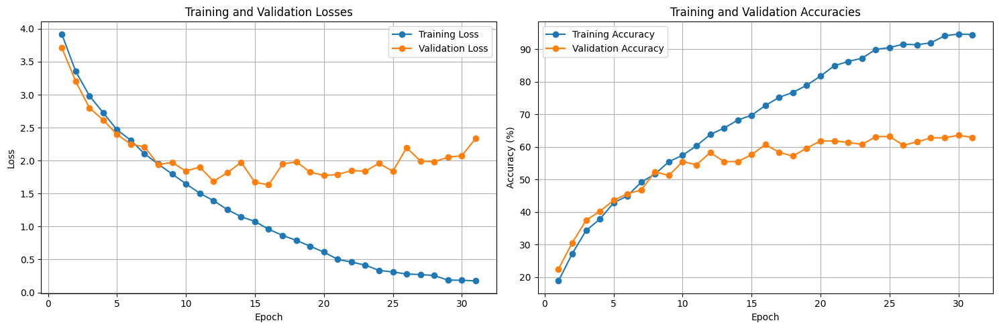

In [7]:
# Plot final training metrics
plt.figure(figsize=(15, 5))

# Plot losses
plt.subplot(1, 2, 1)
plt.plot(epochs_list, train_losses, label='Training Loss', marker='o')
plt.plot(epochs_list, val_losses, label='Validation Loss', marker='o')
plt.title('Training and Validation Losses')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# Plot accuracies
plt.subplot(1, 2, 2)
plt.plot(epochs_list, train_accuracies, label='Training Accuracy', marker='o')
plt.plot(epochs_list, val_accuracies, label='Validation Accuracy', marker='o')
plt.title('Training and Validation Accuracies')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.savefig('training_metrics.png')
plt.show()

In [9]:
classification_model.eval()
correct = 0
top_3_correct = 0
top_5_correct = 0
total = 0
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = classification_model(images)
        _, predicted = outputs.topk(5, dim=1)

        total += labels.size(0)
        correct += (predicted[:, 0] == labels).sum().item()
        top_3_correct += (predicted[:, :3] == labels.unsqueeze(1)).any(dim=1).sum().item()
        top_5_correct += (predicted == labels.unsqueeze(1)).any(dim=1).sum().item()
        
        all_preds.extend(predicted[:, 0].cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Print accuracies
print("\nFinal Test Results:")
print(f'Top-1 Accuracy: {100 * correct / total:.2f}%')
print(f'Top-3 Accuracy: {100 * top_3_correct / total:.2f}%')
print(f'Top-5 Accuracy: {100 * top_5_correct / total:.2f}%')


Final Test Results:
Top-1 Accuracy: 61.46%
Top-3 Accuracy: 75.29%
Top-5 Accuracy: 80.90%


Random Sample Predictions:


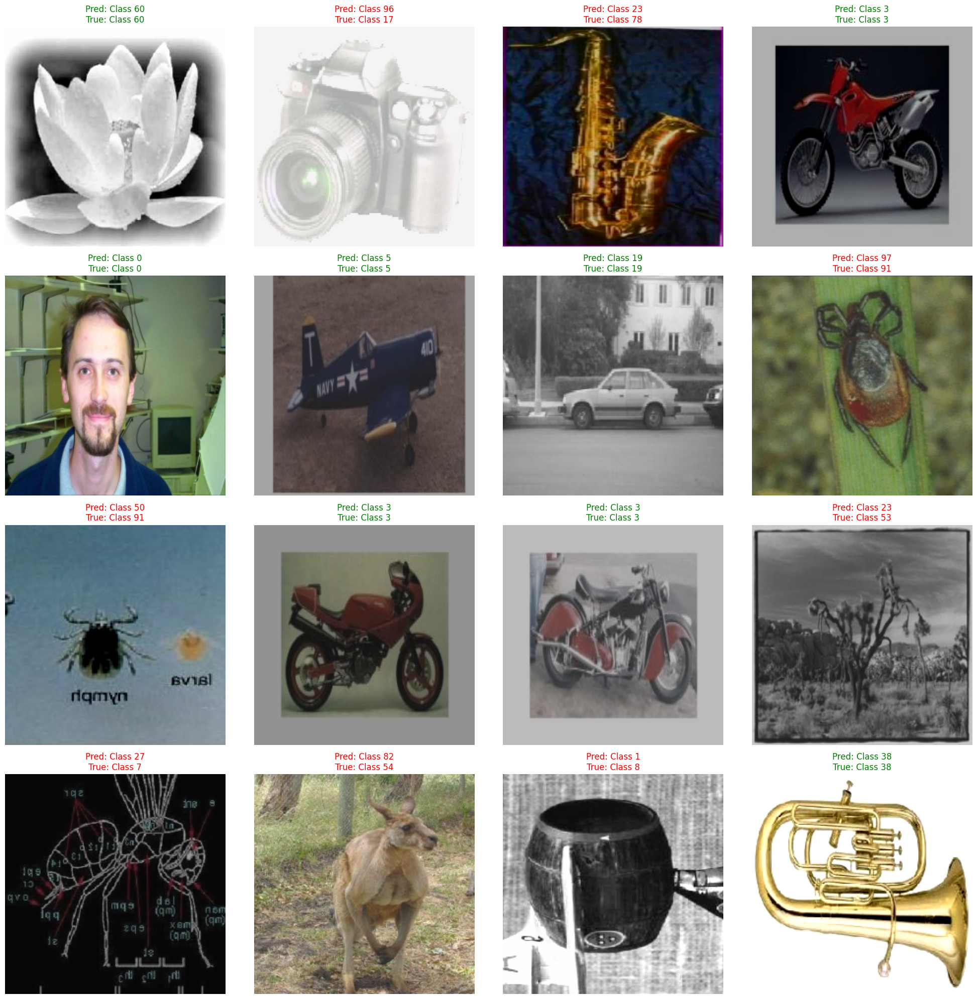


Predictions by Class:


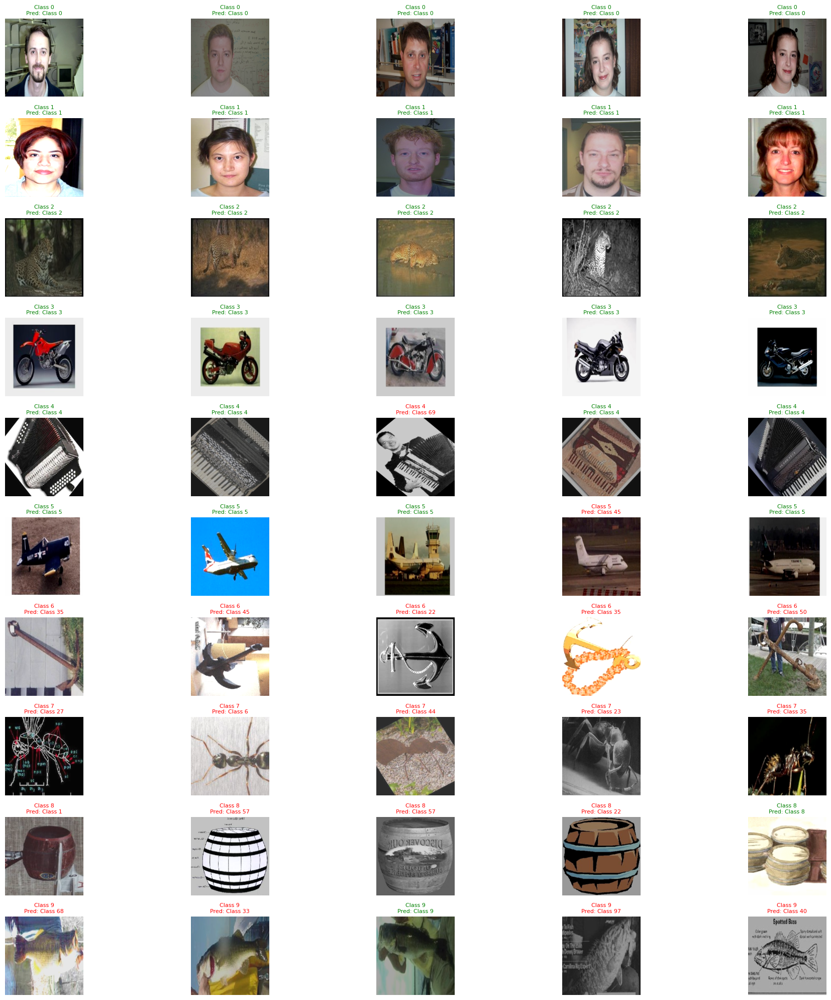


Most Confused Class Pairs:


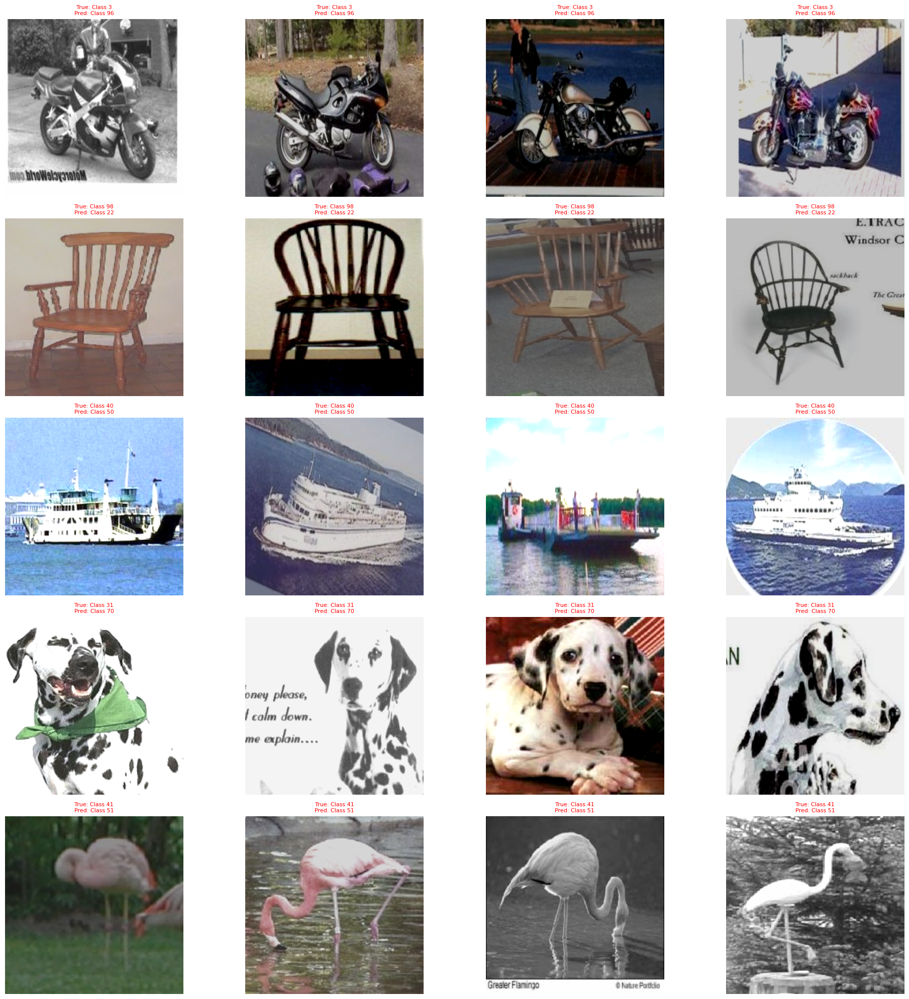

In [10]:
import matplotlib.pyplot as plt
import torchvision.utils as vutils
import numpy as np
from torchvision import transforms

def denormalize(tensor):
    """Denormalize the tensor back to image format"""
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1).to(tensor.device)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1).to(tensor.device)
    return tensor * std + mean

def visualize_predictions(model, test_loader, class_names, num_images=16):
    """Visualize predictions with actual images"""
    model.eval()
    
    # Get a batch of images
    dataiter = iter(test_loader)
    images, labels = next(dataiter)
    images = images[:num_images]
    labels = labels[:num_images]
    
    # Get predictions
    with torch.no_grad():
        images = images.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
    
    # Create figure
    plt.figure(figsize=(20, 20))
    
    for idx in range(num_images):
        ax = plt.subplot(4, 4, idx + 1)
        img = denormalize(images[idx].cpu())
        img = img.permute(1, 2, 0).numpy()
        img = np.clip(img, 0, 1)
        
        plt.imshow(img)
        color = 'green' if preds[idx] == labels[idx] else 'red'
        title = f'Pred: {class_names[preds[idx]]}\nTrue: {class_names[labels[idx]]}'
        plt.title(title, color=color)
        plt.axis('off')
    
    plt.tight_layout()
    plt.savefig('prediction_visualization.png')
    plt.show()

def visualize_class_predictions(model, test_loader, class_names, num_classes=10, samples_per_class=5):
    """Visualize multiple samples for each class with their predictions"""
    model.eval()
    
    # Dictionary to store images for each class
    class_images = {i: [] for i in range(num_classes)}
    class_preds = {i: [] for i in range(num_classes)}
    
    # Collect images for each class
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            
            for img, label, pred in zip(images, labels, preds):
                if label < num_classes and len(class_images[label.item()]) < samples_per_class:
                    class_images[label.item()].append(img.cpu())
                    class_preds[label.item()].append(pred.cpu())
            
            # Check if we have enough samples for each class
            if all(len(imgs) >= samples_per_class for imgs in class_images.values()):
                break
    
    # Create visualization
    plt.figure(figsize=(20, 2*num_classes))
    
    for class_idx in range(num_classes):
        for sample_idx in range(min(samples_per_class, len(class_images[class_idx]))):
            plt.subplot(num_classes, samples_per_class, 
                       class_idx * samples_per_class + sample_idx + 1)
            
            img = denormalize(class_images[class_idx][sample_idx])
            img = img.permute(1, 2, 0).numpy()
            img = np.clip(img, 0, 1)
            
            plt.imshow(img)
            pred = class_preds[class_idx][sample_idx]
            color = 'green' if pred == class_idx else 'red'
            title = f'{class_names[class_idx]}\nPred: {class_names[pred]}'
            plt.title(title, color=color, fontsize=8)
            plt.axis('off')
    
    plt.tight_layout()
    plt.savefig('class_prediction_visualization.png')
    plt.show()

# Get class names
try:
    class_names = test_dataset.dataset.classes
except:
    class_names = [f"Class {i}" for i in range(101)]

# Visualize random predictions
print("Random Sample Predictions:")
visualize_predictions(classification_model, test_loader, class_names)

# Visualize specific classes
print("\nPredictions by Class:")
visualize_class_predictions(classification_model, test_loader, class_names, 
                          num_classes=10,  # Show first 10 classes
                          samples_per_class=5)  # Show 5 samples per class

# Visualize most confused classes
def visualize_confused_classes(model, test_loader, class_names, num_pairs=5, samples_per_pair=4):
    """Visualize the most commonly confused class pairs"""
    model.eval()
    
    # Collect predictions and actual labels
    all_preds = []
    all_labels = []
    all_images = []
    
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.numpy())
            all_images.extend(images.cpu())
    
    # Create confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    np.fill_diagonal(cm, 0)  # Remove correct predictions
    
    # Find most confused pairs
    confused_pairs = []
    for i in range(len(cm)):
        for j in range(len(cm)):
            if i != j:
                confused_pairs.append((i, j, cm[i, j]))
    
    confused_pairs.sort(key=lambda x: x[2], reverse=True)
    
    # Visualize top confused pairs
    plt.figure(figsize=(20, 4*num_pairs))
    
    for pair_idx, (true_class, pred_class, _) in enumerate(confused_pairs[:num_pairs]):
        # Find samples of this confusion
        confused_samples = [(img, true, pred) 
                          for img, true, pred in zip(all_images, all_labels, all_preds)
                          if true == true_class and pred == pred_class][:samples_per_pair]
        
        for sample_idx, (img, true, pred) in enumerate(confused_samples):
            plt.subplot(num_pairs, samples_per_pair, 
                       pair_idx * samples_per_pair + sample_idx + 1)
            
            img = denormalize(img)
            img = img.permute(1, 2, 0).numpy()
            img = np.clip(img, 0, 1)
            
            plt.imshow(img)
            title = f'True: {class_names[true]}\nPred: {class_names[pred]}'
            plt.title(title, color='red', fontsize=8)
            plt.axis('off')
    
    plt.tight_layout()
    plt.savefig('confused_classes_visualization.png')
    plt.show()

# Visualize most confused classes
print("\nMost Confused Class Pairs:")
visualize_confused_classes(classification_model, test_loader, class_names)